In [36]:
# 필요한 패키지 임포트

import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
plt.rcParams['figure.dpi'] = 300

In [37]:
# 데이터 불러오기
df = pd.read_csv("wine-quality.csv")

# 데이터 샘플 확인
df.head()

,type,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,white,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6
1,white,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6
2,white,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6
3,white,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6
4,white,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6


In [38]:
# 이 데이터셋은 총 13개의 컬럼으로 fixed acidity(와인의 산도), achool(알코올 도수),
# pH(수소 이온 농도) 등의 요소와 품질 점수(quality)가 기록돼 있다.
# type 변수를 제외하고는 모두 숫자형 변수로 구성되어 있어서 공분산과 상관계수를 분석하기에 적합하다.
# 산점도 행렬을 그려서 전체 변수 간의 관계가 어떤지 한눈에 확인한다.

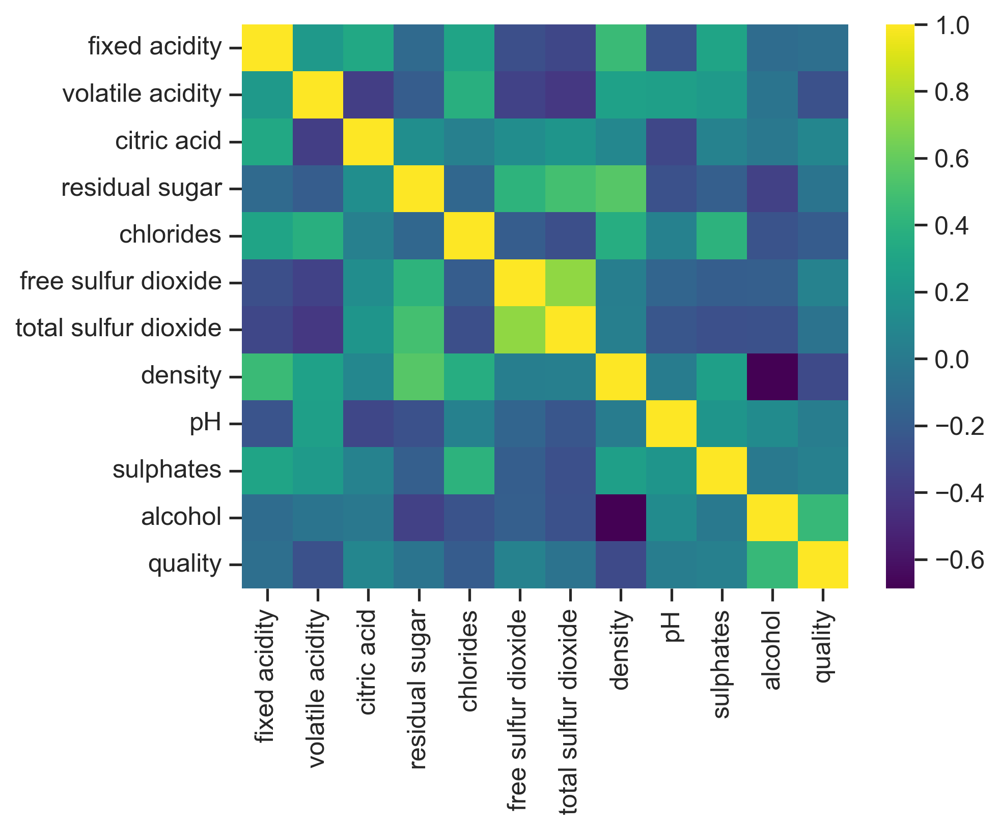

In [39]:
# 산점도 행렬 시각화
sns.set(font_scale=1.1) ## 폰트 크기 설정
sns.set_style('ticks') ## 축 눈금 설정
sns.pairplot(df, 
             diag_kind='kde') # 상관계수가 1이면 분포로 표시
plt.show()

In [40]:
# 몇 개의 산점도는 어느 정도의 상관성이 보이는 것을 확인할 수 있다.
# 종속변수라 할 수 있는 quality 변수는 자연수 형태로 3~9로만 이루어져 있기 때문에 다른 변수들과 줄무늬 형태의 산점도를 보인다.
# diag_kind='kde' 옵션은 동일한 변수의 산점도를 분포로 표현해주는 기능을 한다.
# 동일한 변수는 일직선으로만 나오기 때문에 큰 의미가 없으므로 분포도로 변환하여 정보량을 늘리는 것이다.
# 다음으로 공분산을 산출한다. cov() 함수를 이용하면 간단히 할 수 있다.

In [41]:
# 공분산 확인
df.cov()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
fixed acidity,1.681560,0.047012,0.060971,-0.693045,0.013564,-6.524162,-24.162531,0.001786,-0.052524,0.057990,-0.147911,-0.087224
volatile acidity,0.047012,0.027109,-0.009043,-0.154122,0.002177,-1.032411,-3.861743,0.000134,0.006898,0.005526,-0.007509,-0.038246
citric acid,0.060971,-0.009043,0.021102,0.098498,0.000200,0.344101,1.602662,0.000042,-0.007675,0.001245,-0.001808,0.010874
residual sugar,-0.693045,-0.154122,0.098498,22.639751,-0.021493,34.060547,133.334227,0.007884,-0.204174,-0.131562,-2.041388,-0.153011
chlorides,0.013564,0.002177,0.000200,-0.021493,0.001228,-0.121269,-0.553673,0.000038,0.000252,0.002061,-0.010735,-0.006145
free sulfur dioxide,-6.524162,-1.032411,0.344101,34.060547,-0.121269,315.041192,723.261972,0.001369,-0.414329,-0.497973,-3.807165,0.859664
total sulfur dioxide,-24.162531,-3.861743,1.602662,133.334227,-0.553673,723.261972,3194.720039,0.005491,-2.159577,-2.316258,-17.914646,-2.042704
density,0.001786,0.000134,0.000042,0.007884,0.000038,0.001369,0.005491,0.000009,0.000006,0.000116,-0.002456,-0.000801
pH,-0.052524,0.006898,-0.007675,-0.204174,0.000252,-0.414329,-2.159577,0.000006,0.025840,0.004575,0.023203,0.002719
sulphates,0.057990,0.005526,0.001245,-0.131562,0.002061,-0.497973,-2.316258,0.000116,0.004575,0.022146,-0.000579,0.005032


In [42]:
# 앞에서 알아보았듯이 공분산은 각 변수 간의 다른 척도 기준이 그대로 반영되어 직관적으로 상관성의 높고 낮음을 파악하기 힘들다.
# 동일 변수를 제외하고 얼핏 봤을 때 free sulfur dioxide와 total sulfur dioxide 변수가 723.2로 높은 공분산을 보이는 것이 눈에 띈다.
# 하지만 역시 공분산으로는 변수 간 상관성을 분석하기에 가독성이 떨어진다.
# 상관 분석도 corr() 함수만 실행하면 바로 결과를 확인할 수 있다. 기본적으로 피어슨 상관계수를 산출하므로 method='pearson' 옵션은 생략해도 된다.

In [43]:
# 피어슨 상관계수 확인
df.corr(method='pearson')

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
fixed acidity,1.000000,0.220172,0.323736,-0.112319,0.298421,-0.283317,-0.329747,0.459204,-0.251814,0.300380,-0.095603,-0.077031
volatile acidity,0.220172,1.000000,-0.378061,-0.196702,0.377167,-0.353230,-0.414928,0.271193,0.260660,0.225476,-0.038248,-0.265953
citric acid,0.323736,-0.378061,1.000000,0.142486,0.039315,0.133437,0.195218,0.096320,-0.328689,0.057613,-0.010433,0.085706
residual sugar,-0.112319,-0.196702,0.142486,1.000000,-0.128902,0.403439,0.495820,0.552498,-0.267050,-0.185745,-0.359706,-0.036825
chlorides,0.298421,0.377167,0.039315,-0.128902,1.000000,-0.195042,-0.279580,0.362594,0.044806,0.395332,-0.256861,-0.200886
free sulfur dioxide,-0.283317,-0.353230,0.133437,0.403439,-0.195042,1.000000,0.720934,0.025717,-0.145191,-0.188489,-0.179838,0.055463
total sulfur dioxide,-0.329747,-0.414928,0.195218,0.495820,-0.279580,0.720934,1.000000,0.032395,-0.237687,-0.275381,-0.265740,-0.041385
density,0.459204,0.271193,0.096320,0.552498,0.362594,0.025717,0.032395,1.000000,0.011920,0.259454,-0.686745,-0.305858
pH,-0.251814,0.260660,-0.328689,-0.267050,0.044806,-0.145191,-0.237687,0.011920,1.000000,0.191248,0.121002,0.019366
sulphates,0.300380,0.225476,0.057613,-0.185745,0.395332,-0.188489,-0.275381,0.259454,0.191248,1.000000,-0.003261,0.038729


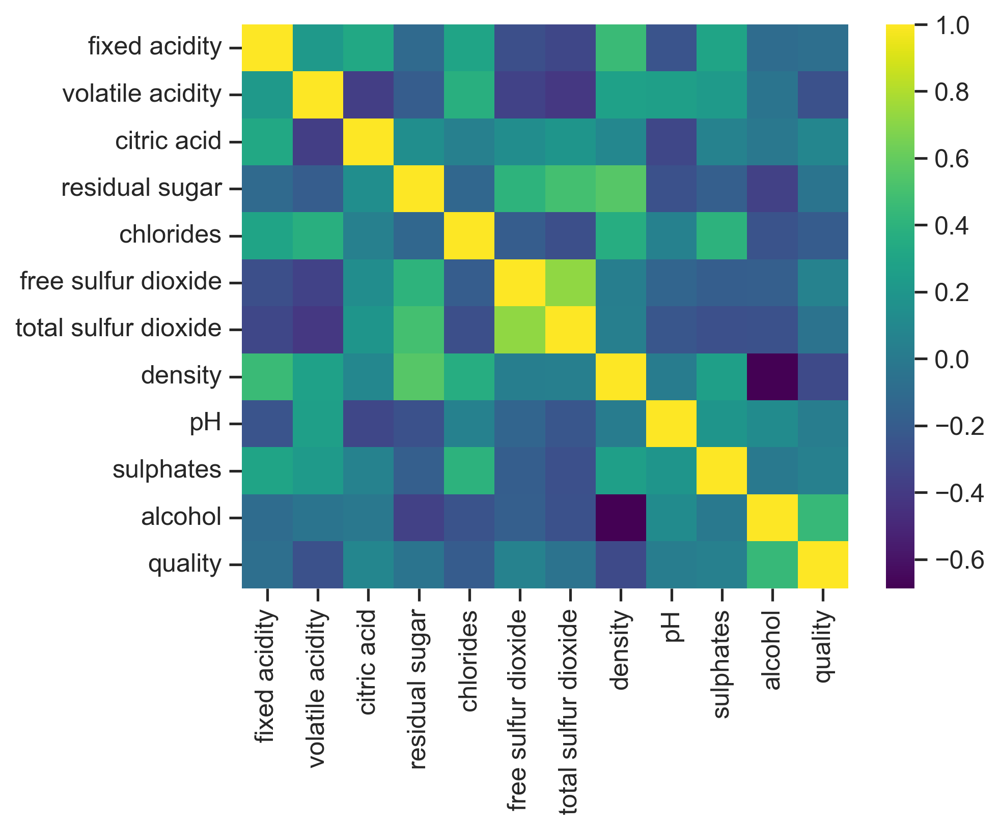

In [44]:
# 히트맵 시각화
sns.heatmap(df.corr(), cmap='viridis')
plt.show()

In [45]:
# 동일 변수 간에는 상관계수 1로 나오고 있고, -1 ~ 1 사이의 값을 가지고 있다. 
# 이제 어떤 변수 간에 상관성이 높고 낮은지 쉽게 알수 있다. 참고로 cov() 함수와 corr() 함수는 알아서 문자형 변수를 제외하고
# 변수 간 상관관계를 계산해 준다. 따라서 별도로 변수 선택 과정을 해주지 않아도 무방하다.
# 다만 고유번호와 같은 숫자형 임에도 수치적 의미가 없는 변수는 가독성을 위해 drop()함수로 사전에 제거해 주는 것이 좋다.

# 이번에는 상관계수를 히트맵으로 시각화하여 보다 쉽게 상관성의 높고 낮음을 파악해 보자.

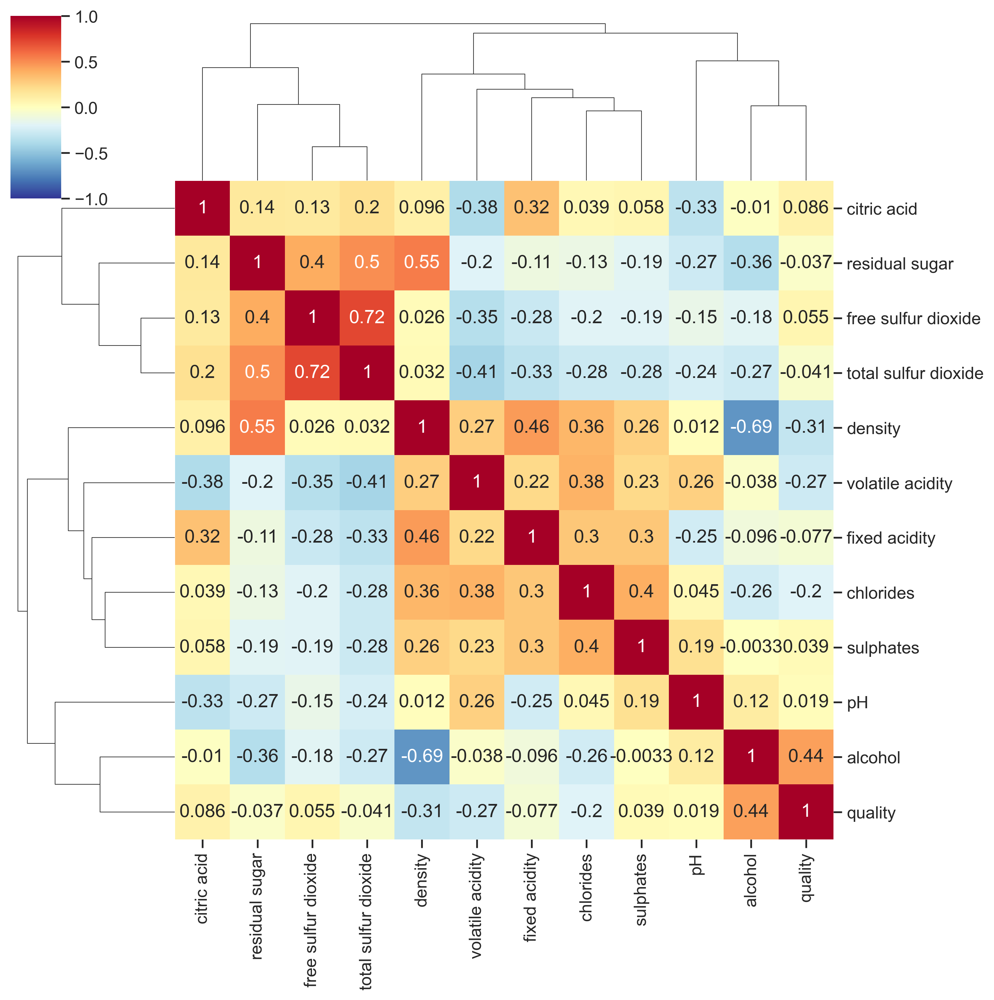

In [46]:
# clustermap 히트맵 시각화
sns.clustermap(df.corr(), 
               annot = True,      
               cmap = 'RdYlBu_r',  
               vmin = -1, vmax = 1,
              )
plt.show()

In [ ]:
# 이제 히트맵과 함께 상관계수도 확인할 수 있게 되었다.
# total sulfur dioxide 변수와 free sulfur dioxide 변수의 상관계수는 0.72로 강한 양의 상관관계를 나타내는 것을 직관적으로 알 수 있다.
# Density와 alchool은 강한 상관관계를 보인다. 즉, 와인의 밀도가 높을 수록
# 알코올 도수가 낮은 경향이 있다는 것을 알 수 있다. 그리고 clustermap은 기존 히트맵에 상관성이 강한 변수들끼리 묶어서 표현해 주는 기능이 추가되었다.

# 끝으로 히트맵의 가독성을 높여보자. 상관도 히트맵은 동일한 변수 조합이 두 번씩 나와서 보기 불편하다.
# 그래서 중복되는 부분을 제외하고 시각화하는 방법을 사용하면 깔끔하게 